In [1]:
# ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
import math, time, random, datetime

# data analysis and wrangling
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

In [3]:
# visualization
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

#import for interactive plotting
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
%matplotlib inline

In [4]:
# Preprocessing
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize, StandardScaler

In [5]:
# machine learning
from sklearn import model_selection, tree, preprocessing, metrics, linear_model
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron,SGDClassifier,LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split,StratifiedKFold, GridSearchCV, learning_curve, cross_val_score
from catboost import CatBoostClassifier, Pool, cv

# Import and Inspect Data

In [6]:
df = pd.read_csv('Dataset FinPro.csv')

In [7]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [8]:
df.shape

(1470, 35)

# Data Summary

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df['Attrition'] = df['Attrition'].apply(lambda x:1 if x == "Yes" else 0 )
df['OverTime'] = df['OverTime'].apply(lambda x:1 if x =="Yes" else 0 )

In [11]:
# Define visualization for categorical features

def categorical_column_viz(col_name):
    f, ax = plt.subplots(1, 2, figsize=(10, 6))

    # Count Plot
    df[col_name].value_counts().plot.bar(cmap='Set1', ax=ax[0])
    ax[0].set_title(f'Number of Employee by {col_name}')
    ax[0].set_ylabel('Count')
    ax[0].set_xlabel(f'{col_name}')

    # Attrition Count per factors
    sns.countplot(x=col_name, hue='Attrition', data=df, ax=ax[1], palette='Set1')
    ax[1].set_title(f'Attrition by {col_name}')
    ax[1].set_xlabel(f'{col_name}')
    ax[1].set_ylabel('Count')

In [12]:
# Define visualization for numerical features

def numerical_column_viz(col_name):
    f,ax = plt.subplots(1,2, figsize=(18,6))
    sns.kdeplot(attrition[col_name], label='Employee who left',ax=ax[0], shade=True, color='palegreen')
    sns.kdeplot(no_attrition[col_name], label='Employee who stayed', ax=ax[0], shade=True, color='salmon')
    
    sns.boxplot(y=col_name, x='Attrition',data=df, palette='Set3', ax=ax[1])

## Extracting Features

In [13]:
# drop the unnecessary columns (based EDA Stage 1)
df.drop(['EmployeeNumber','Over18','StandardHours','EmployeeCount'],axis=1,inplace=True)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   int64 
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [15]:
# 'EnviornmentSatisfaction', 'JobInvolvement', 'JobSatisfacction', 'RelationshipSatisfaction', 'WorklifeBalance' can be clubbed into a single feature 'Accumulated_Satisfaction'

df['Accumulated_Satisfaction'] = (df['EnvironmentSatisfaction'] + 
                            df['JobInvolvement'] + 
                            df['JobSatisfaction'] + 
                            df['RelationshipSatisfaction'] +
                            df['WorkLifeBalance']) /5 

In [17]:
attrition = df[df['Attrition'] == 1]
no_attrition = df[df['Attrition']==0]

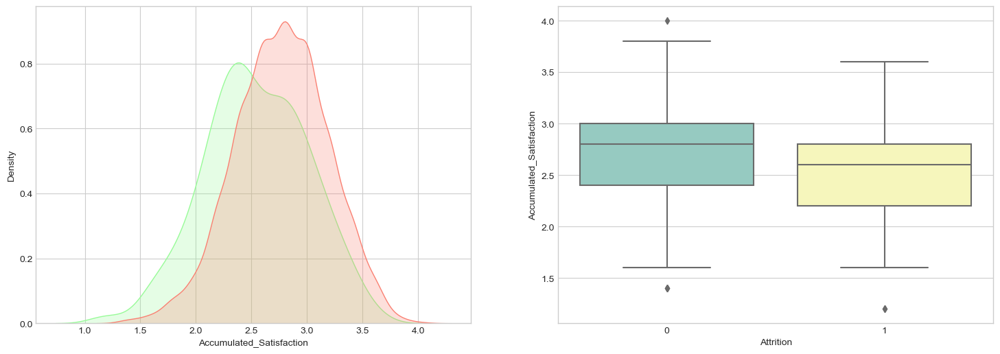

In [18]:
numerical_column_viz('Accumulated_Satisfaction')

In [19]:
df.Accumulated_Satisfaction.describe()

count    1470.000000
mean        2.730748
std         0.428551
min         1.200000
25%         2.400000
50%         2.800000
75%         3.000000
max         4.000000
Name: Accumulated_Satisfaction, dtype: float64

In [20]:
df.corr()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Accumulated_Satisfaction
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,0.509604,-0.004892,...,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089,0.032488
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,-0.103369,-0.006846,-0.130016,-0.169105,-0.103481,...,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199,-0.193395
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.002966,0.030571,...,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363,0.031899
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,0.005303,-0.003669,...,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406,-0.012619
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,0.101589,-0.011296,...,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065,-0.006924
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,0.001212,-0.006784,...,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999,0.516866
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.027853,-0.071335,...,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123,-0.048763
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.012630,-0.021476,...,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976,0.329289
JobLevel,0.509604,-0.169105,0.002966,0.005303,0.101589,0.001212,-0.027853,-0.012630,1.000000,-0.001944,...,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281,0.018812
JobSatisfaction,-0.004892,-0.103481,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,...,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656,0.491394


In [21]:
# Because Accumulated_Satisfaction has higher correlation to Attrition compared to its constituents, then we consider to drop them all 

df.drop(['EnvironmentSatisfaction', 'JobInvolvement', 'JobSatisfaction', 'RelationshipSatisfaction', 'WorkLifeBalance'],axis=1,inplace=True)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   int64  
 2   BusinessTravel            1470 non-null   object 
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   object 
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   object 
 8   Gender                    1470 non-null   object 
 9   HourlyRate                1470 non-null   int64  
 10  JobLevel                  1470 non-null   int64  
 11  JobRole                   1470 non-null   object 
 12  MaritalStatus             1470 non-null   object 
 13  MonthlyIncome             1470 non-null   int64  
 14  MonthlyR

In [23]:
# Extract new feature #2 'YearsWorkingPerCompany' 

df['YearsWorkingPerCompany'] = df['TotalWorkingYears'] / df['NumCompaniesWorked']
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,Gender,HourlyRate,...,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Accumulated_Satisfaction,YearsWorkingPerCompany
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,Female,94,...,3,0,8,0,6,4,0,5,2.2,1.000000
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,Male,61,...,4,1,10,3,10,7,1,7,2.8,10.000000
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,Male,92,...,3,0,7,3,0,0,0,0,2.8,1.166667
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,Female,56,...,3,0,8,3,8,7,3,0,3.2,8.000000
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,Male,40,...,3,1,6,3,2,2,2,2,2.6,0.666667


In [24]:
df['YearsWorkingPerCompany'].describe()

count    1470.000000
mean             inf
std              NaN
min         0.000000
25%         2.166667
50%         5.000000
75%        10.000000
max              inf
Name: YearsWorkingPerCompany, dtype: float64

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   int64  
 2   BusinessTravel            1470 non-null   object 
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   object 
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   object 
 8   Gender                    1470 non-null   object 
 9   HourlyRate                1470 non-null   int64  
 10  JobLevel                  1470 non-null   int64  
 11  JobRole                   1470 non-null   object 
 12  MaritalStatus             1470 non-null   object 
 13  MonthlyIncome             1470 non-null   int64  
 14  MonthlyR

In [26]:
# Karena terdapat data pada fitur YearsWorkingPerCompany berupa inf, makan akan dilakukan modif pada fitur NumCompaniesWorked, TotalWorkingYears, dan YearsAtCOmpany

df.drop(df[(df['NumCompaniesWorked'] == 0) & (df['YearsAtCompany'] != df['TotalWorkingYears'])].index, axis=0, inplace=True)


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1273 entries, 0 to 1469
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1273 non-null   int64  
 1   Attrition                 1273 non-null   int64  
 2   BusinessTravel            1273 non-null   object 
 3   DailyRate                 1273 non-null   int64  
 4   Department                1273 non-null   object 
 5   DistanceFromHome          1273 non-null   int64  
 6   Education                 1273 non-null   int64  
 7   EducationField            1273 non-null   object 
 8   Gender                    1273 non-null   object 
 9   HourlyRate                1273 non-null   int64  
 10  JobLevel                  1273 non-null   int64  
 11  JobRole                   1273 non-null   object 
 12  MaritalStatus             1273 non-null   object 
 13  MonthlyIncome             1273 non-null   int64  
 14  MonthlyR

In [28]:
df['YearsWorkingPerCompany'].describe()

count    1273.000000
mean        5.649048
std         5.324160
min         0.000000
25%         2.000000
50%         4.000000
75%         8.000000
max        40.000000
Name: YearsWorkingPerCompany, dtype: float64

In [30]:
attrition = df[df['Attrition'] == 1]
no_attrition = df[df['Attrition']==0]

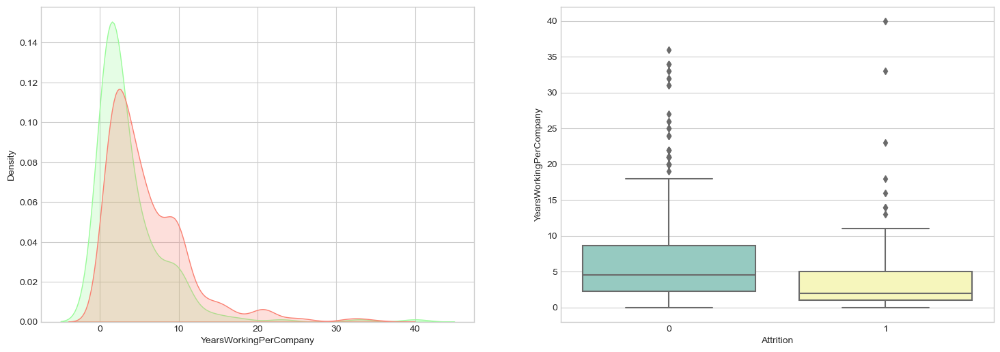

In [31]:
numerical_column_viz('YearsWorkingPerCompany')

## Data Cleansing

Berdasarkan EDA (Stage 1) sebelumnya, maka akan dilakukan data cleansing sebagai berikut :

1. Missing value: There's **no missing value in dataset**
2. Duplicates: There's **no duplicates in dataset**
3. Handle Outliers: **handling outlier with zscore > 3**
4. Feature transformation: **perform transfor log1p for positiveskewed distribution features**

In [32]:
#Transform Possitively Skewed Features
positively_skewed_features = ['DistanceFromHome', 'MonthlyIncome', 'TotalWorkingYears',
                         'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager','PercentSalaryHike', 'YearsWorkingPerCompany']

# Log-transform the positively skewed features
for feature in positively_skewed_features:
    df[feature] = np.log1p(df[feature])

# Check the resulting DataFrame
print(df.head())

   Age  Attrition     BusinessTravel  DailyRate              Department  \
0   41          1      Travel_Rarely       1102                   Sales   
1   49          0  Travel_Frequently        279  Research & Development   
2   37          1      Travel_Rarely       1373  Research & Development   
3   33          0  Travel_Frequently       1392  Research & Development   
4   27          0      Travel_Rarely        591  Research & Development   

   DistanceFromHome  Education EducationField  Gender  HourlyRate  ...  \
0          0.693147          2  Life Sciences  Female          94  ...   
1          2.197225          1  Life Sciences    Male          61  ...   
2          1.098612          2          Other    Male          92  ...   
3          1.386294          4  Life Sciences  Female          56  ...   
4          1.098612          1        Medical    Male          40  ...   

   PerformanceRating StockOptionLevel TotalWorkingYears  \
0                  3                0        

In [33]:
df[positively_skewed_features].describe()

,DistanceFromHome,MonthlyIncome,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,PercentSalaryHike,YearsWorkingPerCompany
count,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000
mean,1.994113,8.564473,2.314648,1.780298,1.350212,1.317630,2.760734,1.636734
std,0.853943,0.674585,0.715425,0.767731,0.809814,0.820137,0.215061,0.710524
min,0.693147,6.917706,0.000000,0.000000,0.000000,0.000000,2.484907,0.000000
25%,1.098612,7.976595,1.945910,1.098612,1.098612,1.098612,2.564949,1.098612
50%,2.079442,8.530702,2.397895,1.791759,1.386294,1.386294,2.708050,1.609438
75%,2.708050,9.062072,2.833213,2.397895,2.079442,2.079442,2.944439,2.197225
max,3.401197,9.902187,3.713572,3.713572,2.944439,2.890372,3.258097,3.713572


### Handling Outliers

In [34]:
# Step 1: Calculate Z-scores for each feature
z_scores = pd.DataFrame()
for col in df.columns:
    if df[col].dtype in [int, float]:
        z_scores[col] = (df[col] - df[col].mean()) / df[col].std()

# Step 2: Identify rows with Z-scores greater than a threshold (e.g., 3 or -3)
threshold = 3
outlier_flags = (z_scores.abs() > threshold).any(axis=1)

# Step 3: Remove the rows with flagged Z-scores (outliers)
df = df[~outlier_flags]

# Check the resulting DataFrame after removing outliers
print(df.head())

   Age  Attrition     BusinessTravel  DailyRate              Department  \
0   41          1      Travel_Rarely       1102                   Sales   
1   49          0  Travel_Frequently        279  Research & Development   
2   37          1      Travel_Rarely       1373  Research & Development   
3   33          0  Travel_Frequently       1392  Research & Development   
4   27          0      Travel_Rarely        591  Research & Development   

   DistanceFromHome  Education EducationField  Gender  HourlyRate  ...  \
0          0.693147          2  Life Sciences  Female          94  ...   
1          2.197225          1  Life Sciences    Male          61  ...   
2          1.098612          2          Other    Male          92  ...   
3          1.386294          4  Life Sciences  Female          56  ...   
4          1.098612          1        Medical    Male          40  ...   

   PerformanceRating StockOptionLevel TotalWorkingYears  \
0                  3                0        

In [35]:
df.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,NumCompaniesWorked,...,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Accumulated_Satisfaction,YearsWorkingPerCompany
count,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,...,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000
mean,37.217213,0.165574,807.610656,1.992732,2.934426,65.895902,2.050820,8.550545,14286.218852,3.125410,...,3.157377,0.807377,2.305683,2.794262,1.756946,1.334383,1.835246,1.305087,2.733279,1.625342
std,9.082497,0.371850,400.811198,0.855194,1.014559,20.227212,1.081142,0.654078,7101.314540,2.437372,...,0.364305,0.854335,0.674086,1.270399,0.723931,0.792406,2.596439,0.803734,0.428256,0.680124
min,19.000000,0.000000,102.000000,0.693147,1.000000,30.000000,1.000000,6.917706,2094.000000,1.000000,...,3.000000,0.000000,0.693147,0.000000,0.000000,0.000000,0.000000,0.000000,1.600000,0.287682
25%,30.000000,0.000000,469.750000,1.098612,2.000000,48.000000,1.000000,7.982502,8191.750000,1.000000,...,3.000000,0.000000,1.945910,2.000000,1.098612,1.098612,0.000000,1.098612,2.400000,1.098612
50%,36.000000,0.000000,810.000000,2.079442,3.000000,66.000000,2.000000,8.517993,14235.500000,2.000000,...,3.000000,1.000000,2.397895,3.000000,1.791759,1.386294,1.000000,1.386294,2.800000,1.609438
75%,43.000000,0.000000,1162.000000,2.708050,4.000000,83.000000,3.000000,8.985915,20440.500000,4.000000,...,3.000000,1.000000,2.772589,3.000000,2.302585,2.079442,2.000000,2.079442,3.000000,2.197225
max,60.000000,1.000000,1498.000000,3.401197,5.000000,100.000000,5.000000,9.902187,26999.000000,9.000000,...,4.000000,3.000000,3.637586,6.000000,3.610918,2.890372,11.000000,2.890372,4.000000,3.610918


### Encode Categorical Features

In [36]:
# We will encode the selected categorical features

features_to_onehot_encode = ['BusinessTravel', 'Department', 'EducationField',
                            'MaritalStatus', 'JobRole']

# One-hot encode the selected features
df = pd.get_dummies(df, columns=features_to_onehot_encode)
df.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,Gender,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,...,MaritalStatus_Single,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
0,41,1,1102,0.693147,2,Female,94,2,8.698514,19479,...,1,0,0,0,0,0,0,0,1,0
1,49,0,279,2.197225,1,Male,61,2,8.543056,24907,...,0,0,0,0,0,0,0,1,0,0
2,37,1,1373,1.098612,2,Male,92,1,7.645398,2396,...,1,0,0,1,0,0,0,0,0,0
3,33,0,1392,1.386294,4,Female,56,1,7.975908,23159,...,0,0,0,0,0,0,0,1,0,0
4,27,0,591,1.098612,1,Male,40,1,8.151622,16632,...,0,0,0,1,0,0,0,0,0,0


In [37]:
df['Gender'] = df['Gender'].apply(lambda x:1 if x =="Male" else 0 )

In [38]:
df.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,Gender,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,...,MaritalStatus_Single,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
0,41,1,1102,0.693147,2,0,94,2,8.698514,19479,...,1,0,0,0,0,0,0,0,1,0
1,49,0,279,2.197225,1,1,61,2,8.543056,24907,...,0,0,0,0,0,0,0,1,0,0
2,37,1,1373,1.098612,2,1,92,1,7.645398,2396,...,1,0,0,1,0,0,0,0,0,0
3,33,0,1392,1.386294,4,0,56,1,7.975908,23159,...,0,0,0,0,0,0,0,1,0,0
4,27,0,591,1.098612,1,1,40,1,8.151622,16632,...,0,0,0,1,0,0,0,0,0,0


In [39]:
df.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,Gender,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,...,MaritalStatus_Single,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
count,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,...,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000
mean,37.217213,0.165574,807.610656,1.992732,2.934426,0.594262,65.895902,2.050820,8.550545,14286.218852,...,0.311475,0.085246,0.033607,0.179508,0.068033,0.100000,0.053279,0.205738,0.222131,0.052459
std,9.082497,0.371850,400.811198,0.855194,1.014559,0.491236,20.227212,1.081142,0.654078,7101.314540,...,0.463287,0.279362,0.180288,0.383935,0.251905,0.300123,0.224681,0.404405,0.415849,0.223042
min,19.000000,0.000000,102.000000,0.693147,1.000000,0.000000,30.000000,1.000000,6.917706,2094.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,469.750000,1.098612,2.000000,0.000000,48.000000,1.000000,7.982502,8191.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36.000000,0.000000,810.000000,2.079442,3.000000,1.000000,66.000000,2.000000,8.517993,14235.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,43.000000,0.000000,1162.000000,2.708050,4.000000,1.000000,83.000000,3.000000,8.985915,20440.500000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,60.000000,1.000000,1498.000000,3.401197,5.000000,1.000000,100.000000,5.000000,9.902187,26999.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1220 entries, 0 to 1469
Data columns (total 47 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1220 non-null   int64  
 1   Attrition                          1220 non-null   int64  
 2   DailyRate                          1220 non-null   int64  
 3   DistanceFromHome                   1220 non-null   float64
 4   Education                          1220 non-null   int64  
 5   Gender                             1220 non-null   int64  
 6   HourlyRate                         1220 non-null   int64  
 7   JobLevel                           1220 non-null   int64  
 8   MonthlyIncome                      1220 non-null   float64
 9   MonthlyRate                        1220 non-null   int64  
 10  NumCompaniesWorked                 1220 non-null   int64  
 11  OverTime                           1220 non-null   int64

### Split Data Train & Test

In [41]:
from sklearn.model_selection import train_test_split

# Separate the target variable from the features
X = df.drop('Attrition', axis=1)
y = df['Attrition']

# Split the data into training and testing sets (75% train, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Check the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (915, 46)
X_test shape: (305, 46)
y_train shape: (915,)
y_test shape: (305,)


### Scale Data Train & Test

In [43]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the training set
X_train_scaled = scaler.fit_transform(X_train)

# Transform the testing set using the same scaling
X_test_scaled = scaler.transform(X_test)

# Check the scaled data
print("X_train_scaled:\n", X_train_scaled)
print("X_test_scaled:\n", X_test_scaled)

X_train_scaled:
 [[0.82926829 0.17503587 0.462607   ... 0.         0.         0.        ]
 [0.26829268 0.88737446 0.40568387 ... 0.         1.         0.        ]
 [0.53658537 0.58536585 0.462607   ... 0.         1.         0.        ]
 ...
 [0.29268293 0.26470588 0.3383581  ... 0.         0.         0.        ]
 [0.82926829 0.24748924 0.14972585 ... 0.         0.         0.        ]
 [0.53658537 0.16857963 0.55540972 ... 0.         1.         0.        ]]
X_test_scaled:
 [[0.58536585 0.22955524 0.         ... 0.         0.         0.        ]
 [0.19512195 0.91463415 0.14972585 ... 0.         1.         0.        ]
 [0.34146341 0.29626973 0.         ... 0.         0.         0.        ]
 ...
 [0.2195122  0.95552367 0.40568387 ... 0.         0.         0.        ]
 [0.3902439  0.25968436 0.3383581  ... 0.         0.         0.        ]
 [0.56097561 0.32496413 0.96109359 ... 0.         1.         0.        ]]


### Handle Imbalance Class

In [44]:
from imblearn.over_sampling import RandomOverSampler
from collections import Counter

# Check class distribution before oversampling
print("Before oversampling:", Counter(y_train))

# Initialize the RandomOverSampler
oversampler = RandomOverSampler(random_state=42)

# Fit and apply the oversampler only to the training set
X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train_scaled, y_train)

# Check class distribution after oversampling
print("After oversampling:", Counter(y_train_resampled))

Before oversampling: Counter({0: 760, 1: 155})
After oversampling: Counter({0: 760, 1: 760})


### Feature Selection

In [46]:
# Convert the X_train_resampled array back to a DataFrame
X_train_resampled_df = pd.DataFrame(X_train_resampled, columns=X_train.columns)

# Calculate the correlation between each feature and the target variable 'Attrition'
correlations = X_train_resampled_df.corrwith(y_train_resampled)

# Filter features based on correlation threshold
correlation_threshold = 0.07
selected_features = correlations[(correlations > correlation_threshold) | (correlations < -correlation_threshold)]

# Print the selected features and their correlations with 'Attrition'
print(selected_features)

Age                                 -0.185290
DistanceFromHome                     0.088111
JobLevel                            -0.269263
MonthlyIncome                       -0.289819
OverTime                             0.316957
StockOptionLevel                    -0.177223
TotalWorkingYears                   -0.316374
TrainingTimesLastYear               -0.071212
YearsAtCompany                      -0.241875
YearsInCurrentRole                  -0.221577
YearsWithCurrManager                -0.243990
Accumulated_Satisfaction            -0.257034
YearsWorkingPerCompany              -0.311132
BusinessTravel_Non-Travel           -0.151092
BusinessTravel_Travel_Frequently     0.171550
BusinessTravel_Travel_Rarely        -0.070391
Department_Research & Development   -0.159602
Department_Sales                     0.150334
EducationField_Medical              -0.103605
MaritalStatus_Divorced              -0.110062
MaritalStatus_Married               -0.121614
MaritalStatus_Single              

### Recommendation Feature Outside This Dataset

**Recommendations:**
1. Performance Feedback: Frequency and quality of feedback received by the employee.
2. Job Stability: The stability or likelihood of future job changes.
3. Career Growth Opportunities: The perceived potential for career advancement within the company.
4. Company Culture: Employee perceptions of the overall company culture and values.
5. Employee Engagement: The level of employee commitment and emotional attachment to the organization.

## Train Data

In [47]:
from sklearn import metrics
from sklearn.model_selection import cross_val_predict

# Function that runs the requested algorithm and returns the precision metrics
def fit_ml_algo_for_precision(algo, X_train, y_train, cv):
    
    # One Pass
    model = algo.fit(X_train, y_train)
    precision = round(metrics.precision_score(y_train, model.predict(X_train)) * 100, 2)
    
    # Cross Validation 
    train_pred = cross_val_predict(algo, X_train, y_train, cv=cv, n_jobs=-1)
    
    # Cross-validation precision metric
    precision_cv = round(metrics.precision_score(y_train, train_pred) * 100, 2)
    
    return train_pred, precision, precision_cv

### Logistic Regression

In [68]:
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

# Step 2: Create X_train_selected by filtering columns using the selected feature indices
X_train_selected = X_train_resampled[:, selected_feature_indices]

# Step 4: Logistic Regression focusing on Precision
start_time = time.time()
train_pred_log, precision_log, precision_cv_log = fit_ml_algo_for_precision(LogisticRegression(), X_train_selected, y_train_resampled, 10)
log_time = (time.time() - start_time)

# Step 5: Print the results
print("Precision: %s" % precision_log)
print("Precision CV 10-Fold: %s" % precision_cv_log)
print("Running Time: %s" % datetime.timedelta(seconds=log_time))

Precision: 79.95
Precision CV 10-Fold: 77.78
Running Time: 0:01:09.914225


### Support Vector Machine

In [69]:
# SVC
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_svc, precision_svc, precision_cv_svc = fit_ml_algo_for_precision(SVC(), X_train_selected, y_train_resampled, 10)
log_time = (time.time() - start_time)

print("Precision (SVC): %s" % precision_svc)
print("Precision CV 10-Fold (SVC): %s" % precision_cv_svc)
print("Running Time (SVC): %s" % datetime.timedelta(seconds=log_time))

Precision (SVC): 88.83
Precision CV 10-Fold (SVC): 83.33
Running Time (SVC): 0:00:37.922165


### Linear Support Vector Machines 

In [70]:
# Linear SVC
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_svc, precision_linear_svc, precision_cv_linear_svc = fit_ml_algo_for_precision(LinearSVC(),X_train_selected, y_train_resampled, 10)
linear_svc_time = (time.time() - start_time)

print("Precision: %s" % precision_linear_svc)
print("Precision CV 10-Fold: %s" % precision_cv_linear_svc)
print("Running Time: %s" % datetime.timedelta(seconds=linear_svc_time))

Precision: 79.32
Precision CV 10-Fold: 78.19
Running Time: 0:00:00.347326


### K Nearest Neighbour

In [71]:
# K Nearest Neighbour
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_knn, precision_knn, precision_cv_knn = fit_ml_algo_for_precision(KNeighborsClassifier(n_neighbors = 3),X_train_selected,y_train_resampled,10)
knn_time = (time.time() - start_time)
print("Precision: %s" % precision_knn)
print("Precision CV 10-Fold: %s" % precision_cv_knn)
print("Running Time: %s" % datetime.timedelta(seconds=knn_time))

Precision: 90.12
Precision CV 10-Fold: 82.55
Running Time: 0:00:02.097154


### Gaussian Naive Bayes

In [72]:
# Gaussian Naive Bayes
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_gaussian, precision_gaussian, precision_cv_gaussian = fit_ml_algo_for_precision(GaussianNB(),X_train_selected,y_train_resampled,10)
gaussian_time = (time.time() - start_time)

print("Precision: %s" % precision_gaussian)
print("Precision CV 10-Fold: %s" % precision_cv_gaussian)
print("Running Time: %s" % datetime.timedelta(seconds=gaussian_time))

Precision: 60.02
Precision CV 10-Fold: 59.92
Running Time: 0:00:00.220477


### Perceptron

In [73]:
# Perceptron
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_gaussian, precision_perceptron, precision_cv_perceptron = fit_ml_algo_for_precision(Perceptron(),X_train_selected,y_train_resampled,10)
perceptron_time = (time.time() - start_time)

print("Precision: %s" % precision_perceptron)
print("Precision CV 10-Fold: %s" % precision_cv_perceptron)
print("Running Time: %s" % datetime.timedelta(seconds=perceptron_time))

Precision: 70.21
Precision CV 10-Fold: 74.8
Running Time: 0:00:00.279973


### Stochastic Gradient Descent

In [74]:
# Stochastic Gradient Descent
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_sgd, precision_sgd, precision_cv_sgd = fit_ml_algo_for_precision(SGDClassifier(),X_train_selected, y_train_resampled,10)
sgd_time = (time.time() - start_time)

print("Precision: %s" % precision_sgd)
print("Precision CV 10-Fold: %s" % precision_cv_sgd)
print("Running Time: %s" % datetime.timedelta(seconds=sgd_time))

Precision: 78.51
Precision CV 10-Fold: 76.54
Running Time: 0:00:00.246955


### Decision Tree

In [75]:
# Decision Tree
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_dt, precision_dt, precision_cv_dt = fit_ml_algo_for_precision(DecisionTreeClassifier(),X_train_selected, y_train_resampled,10)
dt_time = (time.time() - start_time)

print("Precision: %s" % precision_dt)
print("Precision CV 10-Fold: %s" % precision_cv_dt)
print("Running Time: %s" % datetime.timedelta(seconds=dt_time))

Precision: 100.0
Precision CV 10-Fold: 87.41
Running Time: 0:00:00.491658


### Gradient Boosting Trees

In [76]:
# Gradient Boosting Trees
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_gbt, precision_gbt, precision_cv_gbt = fit_ml_algo_for_precision(GradientBoostingClassifier(),X_train_selected, y_train_resampled,10)
gbt_time = (time.time() - start_time)

print("Precision: %s" % precision_gbt)
print("Precision CV 10-Fold: %s" % precision_cv_gbt)
print("Running Time: %s" % datetime.timedelta(seconds=gbt_time))

Precision: 92.88
Precision CV 10-Fold: 88.49
Running Time: 0:00:29.866046


### Random Forest

In [77]:
# Random Forest
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

start_time = time.time()
train_pred_dt, precision_rf, precision_cv_rf = fit_ml_algo_for_precision(RandomForestClassifier(n_estimators=100),X_train_selected, y_train_resampled,10)
rf_time = (time.time() - start_time)

print("Precision: %s" % precision_rf)
print("Precision CV 10-Fold: %s" % precision_cv_rf)
print("Running Time: %s" % datetime.timedelta(seconds=rf_time))

Precision: 100.0
Precision CV 10-Fold: 95.46
Running Time: 0:00:02.235572


### CatBoost Classifier

In [80]:
# Define the categorical features for the CatBoost model
cat_features = np.where(X_train.dtypes != np.float)[0]
cat_features

array([ 0,  1,  3,  4,  5,  6,  8,  9, 10, 12, 13, 15, 18, 22, 23, 24, 25,
       26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,
       43, 44, 45])

In [81]:
# pool training data and categorical feature labels together
train_pool = Pool(X_train, y_train,cat_features)  

In [89]:
# CatBoost
from sklearn.metrics import precision_score

selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

catboost_model = CatBoostClassifier(iterations=1000, loss_function='Logloss')

catboost_model.fit(X_train_selected, y_train_resampled, plot=True)

train_pred_catboost = catboost_model.predict(X_train_selected)
precision_catboost = round(precision_score(y_train_resampled, train_pred_catboost) *100, 2)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.012319
0:	learn: 0.6849586	total: 2.79ms	remaining: 2.78s
1:	learn: 0.6784148	total: 5.21ms	remaining: 2.6s
2:	learn: 0.6715003	total: 7.38ms	remaining: 2.45s
3:	learn: 0.6644038	total: 10.8ms	remaining: 2.7s
4:	learn: 0.6576351	total: 17.5ms	remaining: 3.49s
5:	learn: 0.6514204	total: 23.8ms	remaining: 3.95s
6:	learn: 0.6442115	total: 38.9ms	remaining: 5.52s
7:	learn: 0.6389494	total: 42.7ms	remaining: 5.29s
8:	learn: 0.6334716	total: 47.8ms	remaining: 5.26s
9:	learn: 0.6268213	total: 52.4ms	remaining: 5.19s
10:	learn: 0.6202676	total: 57ms	remaining: 5.12s
11:	learn: 0.6150321	total: 70.7ms	remaining: 5.82s
12:	learn: 0.6090738	total: 74.3ms	remaining: 5.64s
13:	learn: 0.6039303	total: 78ms	remaining: 5.49s
14:	learn: 0.5987852	total: 80.6ms	remaining: 5.29s
15:	learn: 0.5942196	total: 83.2ms	remaining: 5.11s
16:	learn: 0.5900376	total: 89.3ms	remaining: 5.16s
17:	learn: 0.5848796	total: 92.6ms	remaining: 5.05s
18:	learn: 0.5799892	total: 95.3ms	remaining: 4.92

In [83]:
start_time = time.time()

# Set params for cross-validation as same as initial model
cv_params = catboost_model.get_params()

# cross-validation
cv_data = cv(train_pool,cv_params,fold_count=10,plot=True)
catboost_time = (time.time() - start_time)

# Cross-validation precision metric
precision_cv_catboost = round(np.max(cv_data['test-Precision-mean']) * 100, 2)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/10]
0:	learn: 0.6735810	test: 0.6739085	best: 0.6739085 (0)	total: 16ms	remaining: 16s
1:	learn: 0.6562302	test: 0.6576684	best: 0.6576684 (1)	total: 26.4ms	remaining: 13.2s
2:	learn: 0.6427912	test: 0.6444668	best: 0.6444668 (2)	total: 27.9ms	remaining: 9.29s
3:	learn: 0.6274368	test: 0.6297479	best: 0.6297479 (3)	total: 31ms	remaining: 7.71s
4:	learn: 0.6109366	test: 0.6106672	best: 0.6106672 (4)	total: 40.6ms	remaining: 8.07s
5:	learn: 0.5978013	test: 0.5978422	best: 0.5978422 (5)	total: 49.5ms	remaining: 8.2s
6:	learn: 0.5824768	test: 0.5828500	best: 0.5828500 (6)	total: 58ms	remaining: 8.23s
7:	learn: 0.5731408	test: 0.5741274	best: 0.5741274 (7)	total: 61.2ms	remaining: 7.58s
8:	learn: 0.5610102	test: 0.5610201	best: 0.5610201 (8)	total: 72ms	remaining: 7.93s
9:	learn: 0.5498298	test: 0.5499679	best: 0.5499679 (9)	total: 87ms	remaining: 8.61s
10:	learn: 0.5387744	test: 0.5386608	best: 0.5386608 (10)	total: 98.8ms	remaining: 8.88s
11:	learn: 0.5299229	test: 0.5

## Training Model Results

In [90]:
models = pd.DataFrame({
    'Model': ['Logistic Regression','SVM','Linear SVC','KNN','Naive Bayes','Perceptron',
              'Stochastic Gradient Decent','Decision Tree', 'Gradient Boosting Trees','Random Forest',
              'CatBoost'],
    'Score': [
        precision_log,
        precision_svc,
        precision_linear_svc,
        precision_knn,
        precision_gaussian,
        precision_perceptron,
        precision_sgd,  
        precision_dt,
        precision_gbt,
        precision_rf,
        precision_catboost
    ]})
models.sort_values(by='Score', ascending=False)

,Model,Score
7,Decision Tree,100.00
9,Random Forest,100.00
10,CatBoost,99.87
8,Gradient Boosting Trees,92.88
3,KNN,90.12
1,SVM,88.83
0,Logistic Regression,79.95
2,Linear SVC,79.32
6,Stochastic Gradient Decent,78.51
5,Perceptron,70.21


In [91]:
cv_models = pd.DataFrame({
    'Model': ['Logistic Regression','SVM','Linear SVC','KNN','Naive Bayes','Perceptron',
              'Stochastic Gradient Decent','Decision Tree', 'Gradient Boosting Trees','Random Forest',
              'CatBoost'],
    'Score': [
        precision_cv_log,
        precision_cv_svc,
        precision_cv_linear_svc,
        precision_cv_knn,
        precision_cv_gaussian,
        precision_cv_perceptron,
        precision_cv_sgd,  
        precision_cv_dt,
        precision_cv_gbt,
        precision_cv_rf,
        precision_cv_catboost
    ]})
cv_models.sort_values(by='Score', ascending=False)

,Model,Score
10,CatBoost,100.00
9,Random Forest,95.46
8,Gradient Boosting Trees,88.49
7,Decision Tree,87.41
1,SVM,83.33
3,KNN,82.55
2,Linear SVC,78.19
0,Logistic Regression,77.78
6,Stochastic Gradient Decent,76.54
5,Perceptron,74.80


# Predict Data using RandomForest

In [94]:
model = RandomForestClassifier().fit(X_train, y_train)

In [95]:
predictions = model.predict(X_test)

In [96]:
pred_df = pd.DataFrame(index=X_test.index)

In [97]:
pred_df['Attrition'] = predictions
pred_df.head()

,Attrition
650,0
320,0
55,0
1220,0
909,1


In [98]:
# Cross-validation precision metric
score = round(metrics.precision_score(y_test, predictions) * 100, 2)

In [99]:
print("Precision: %s" % score)

Precision: 83.33


In [100]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.87      0.99      0.93       258
           1       0.83      0.21      0.34        47

    accuracy                           0.87       305
   macro avg       0.85      0.60      0.63       305
weighted avg       0.87      0.87      0.84       305



1. Feature: YearsWorkingPerCompany, Score: 0.10960
2. Feature: MonthlyIncome, Score: 0.10408
3. Feature: Accumulated_Satisfaction, Score: 0.08990
4. Feature: Age, Score: 0.07872
5. Feature: OverTime, Score: 0.07491
6. Feature: DistanceFromHome, Score: 0.06148
7. Feature: TotalWorkingYears, Score: 0.05659
8. Feature: YearsWithCurrManager, Score: 0.04769
9. Feature: YearsAtCompany, Score: 0.04483
10. Feature: StockOptionLevel, Score: 0.04350
11. Feature: TrainingTimesLastYear, Score: 0.04157
12. Feature: YearsInCurrentRole, Score: 0.03997
13. Feature: JobLevel, Score: 0.03751
14. Feature: Department_Research & Development, Score: 0.01847
15. Feature: MaritalStatus_Single, Score: 0.01810
16. Feature: Department_Sales, Score: 0.01652
17. Feature: BusinessTravel_Travel_Frequently, Score: 0.01632
18. Feature: JobRole_Laboratory Technician, Score: 0.01494
19. Feature: EducationField_Medical, Score: 0.01419
20. Feature: MaritalStatus_Married, Score: 0.01274
21. Feature: BusinessTravel_Travel_R

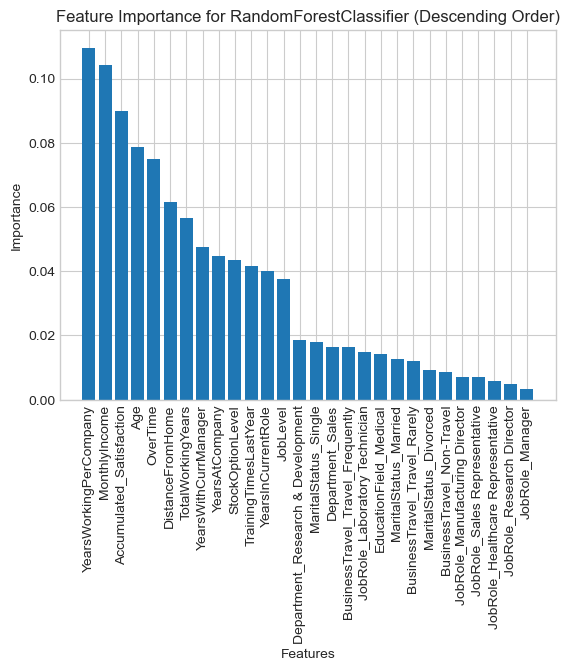

In [103]:
selected_feature_indices = [list(X_train.columns).index(feature) for feature in selected_features.index]

X_train_selected = X_train_resampled[:, selected_feature_indices]

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_selected, y_train_resampled)

importance = rf_model.feature_importances_

sorted_indices = importance.argsort()[::-1]
sorted_importance = importance[sorted_indices]
sorted_features = selected_features.index[sorted_indices]

for i, (feature, score) in enumerate(zip(sorted_features, sorted_importance), 1):
    print(f'{i}. Feature: {feature}, Score: {score:.5f}')

plt.bar(sorted_features, sorted_importance)
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance")
plt.title("Feature Importance for RandomForestClassifier (Descending Order)")
plt.show()